## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "language_es"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "language"
target_positive_class = "es"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6578
Epoch 11 Validation Loss: 0.6840
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6297
Epoch 21 Validation Loss: 0.6824
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/language_es/loss_history.json


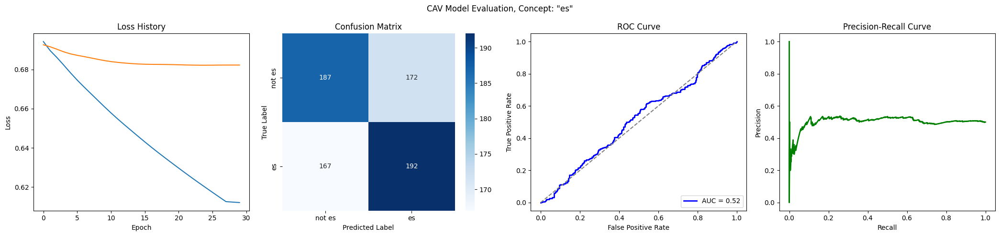

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6894
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6568
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6280
Epoch 21 Validation Loss: 0.6746
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6024
Epoch 31 Validation Loss: 0.6686
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5794
Epoch 41 Validation Loss: 0.6639
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5585
Epoch 51 Validation Loss: 0.6604
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5393
Epoch 61 Validation Loss: 0.6579
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5217
Epoch 71 Validation Loss: 0.6561
Model saved to train

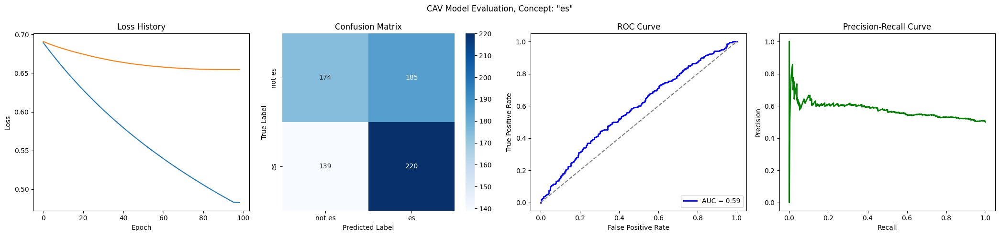

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7000
Epoch 1 Validation Loss: 0.6987
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6685
Epoch 11 Validation Loss: 0.6875
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6422
Epoch 21 Validation Loss: 0.6810
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6184
Epoch 31 Validation Loss: 0.6785
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6019
Epoch 41 Validation Loss: 0.6782
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5997
Epoch 51 Validation Loss: 0.6779
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5976
Epoch 61 Validation Loss: 0.6777
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5975
Epoch 71 Validation Loss: 0.6777
Early stopping at ep

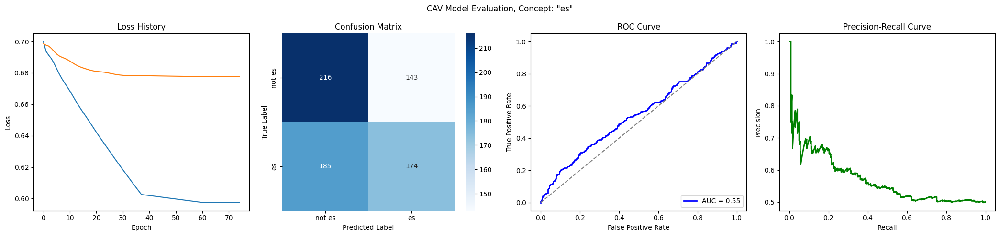

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6629
Epoch 11 Validation Loss: 0.6896
Early stopping at epoch 19
Loss history saved to trainings/language_es/loss_history.json


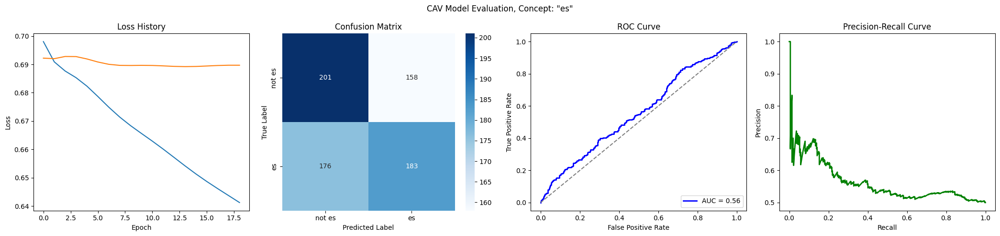

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6870
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/language_es/loss_history.json


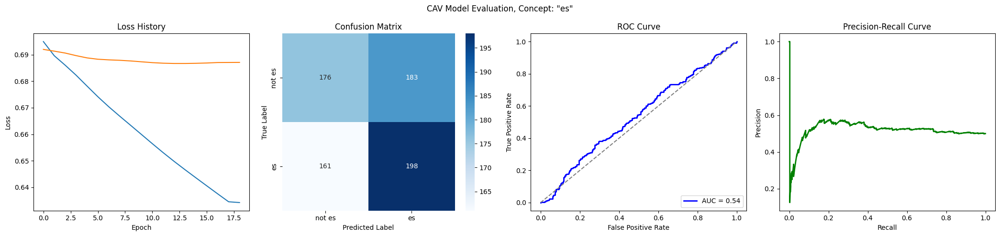

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6187
Epoch 21 Validation Loss: 0.6789
Early stopping at epoch 25
Loss history saved to trainings/language_es/loss_history.json


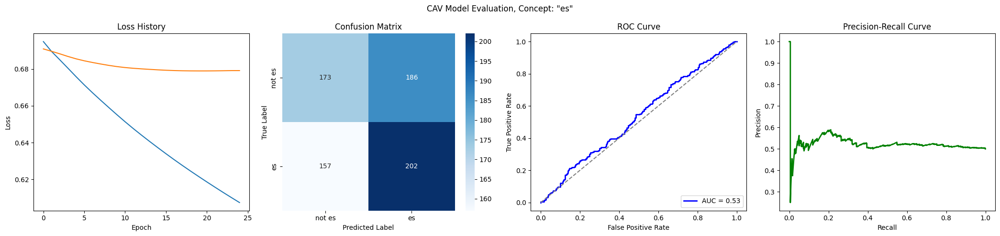

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6530
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6222
Epoch 21 Validation Loss: 0.6793
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5951
Epoch 31 Validation Loss: 0.6771
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5713
Epoch 41 Validation Loss: 0.6757
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5501
Epoch 51 Validation Loss: 0.6746
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5308
Epoch 61 Validation Loss: 0.6738
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5132
Epoch 71 Validation Loss: 0.6735
Model saved to train

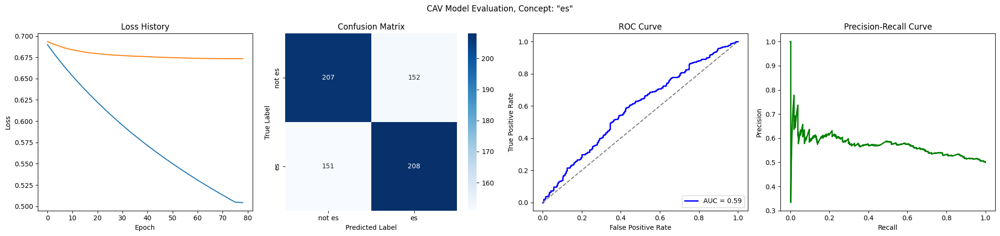

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7043
Epoch 1 Validation Loss: 0.6962
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6665
Epoch 11 Validation Loss: 0.6881
Epoch 21/500
Epoch 21 Train Loss: 0.6567
Epoch 21 Validation Loss: 0.6870
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6536
Epoch 31 Validation Loss: 0.6861
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6509
Epoch 41 Validation Loss: 0.6858
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.6481
Epoch 51 Validation Loss: 0.6856
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.6473
Epoch 61 Validation Loss: 0.6856
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_es/loss_history.json


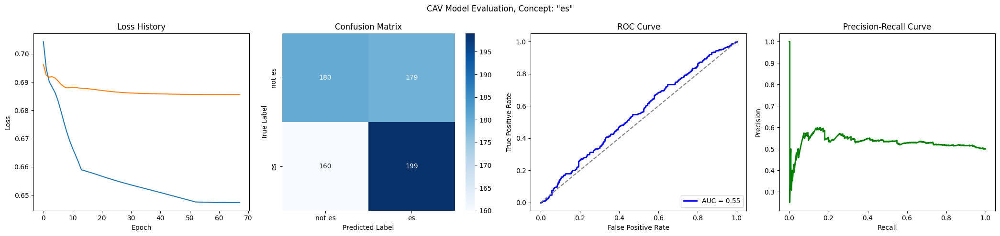

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6537
Epoch 11 Validation Loss: 0.6845
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6222
Epoch 21 Validation Loss: 0.6818
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6789
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5712
Epoch 41 Validation Loss: 0.6757
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5498
Epoch 51 Validation Loss: 0.6732
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5303
Epoch 61 Validation Loss: 0.6719
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5125
Epoch 71 Validation Loss: 0.6715
Model saved to train

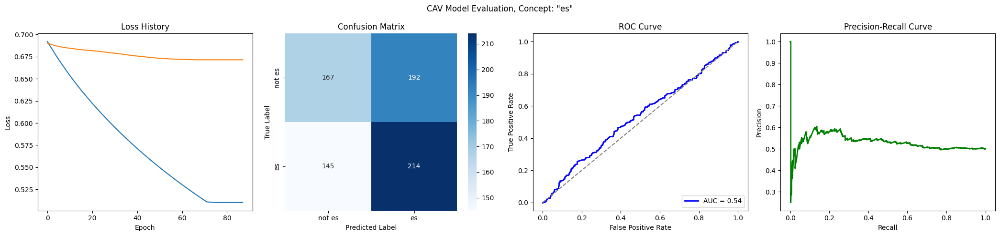

Training run 10/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6564
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6270
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6012
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5781
Epoch 41 Validation Loss: 0.6675
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 47
Loss history saved to trainings/language_es/loss_history.json


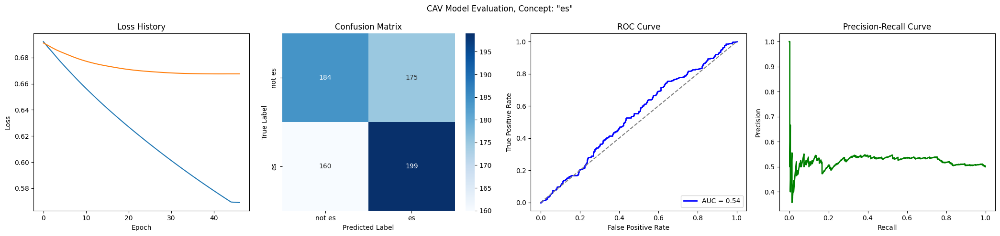

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6482
Epoch 11 Validation Loss: 0.6845
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6135
Epoch 21 Validation Loss: 0.6806
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5851
Epoch 31 Validation Loss: 0.6783
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5604
Epoch 41 Validation Loss: 0.6753
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5383
Epoch 51 Validation Loss: 0.6719
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5185
Epoch 61 Validation Loss: 0.6688
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5004
Epoch 71 Validation Loss: 0.6663
Model saved to trai

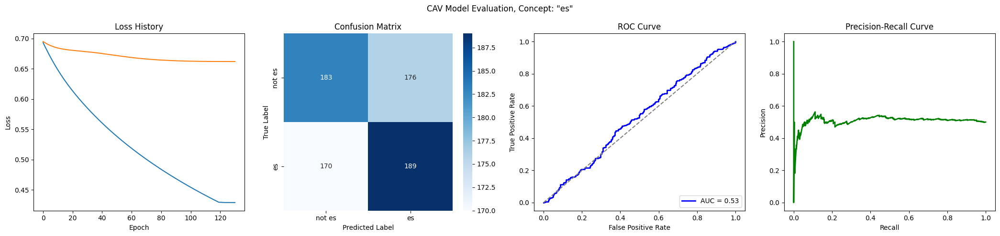

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6650
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6379
Epoch 21 Validation Loss: 0.6719
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6135
Epoch 31 Validation Loss: 0.6677
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5917
Epoch 41 Validation Loss: 0.6651
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5721
Epoch 51 Validation Loss: 0.6630
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5541
Epoch 61 Validation Loss: 0.6613
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5376
Epoch 71 Validation Loss: 0.6604
Model saved to trai

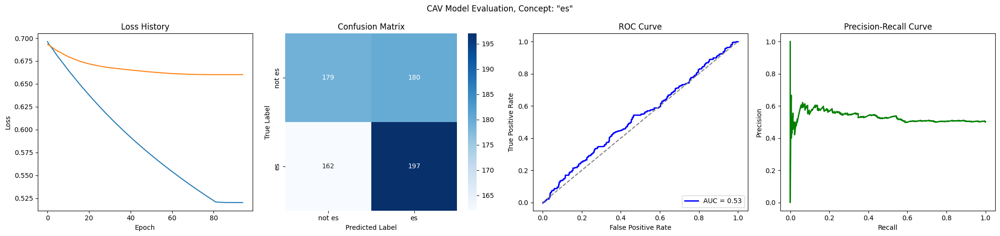

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6913
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6551
Epoch 11 Validation Loss: 0.6852
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6235
Epoch 21 Validation Loss: 0.6812
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6785
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5698
Epoch 41 Validation Loss: 0.6766
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5468
Epoch 51 Validation Loss: 0.6756
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5276
Epoch 61 Validation Loss: 0.6755
Early stopping at epoch 62
Loss history saved to trainings/language_es/loss_history.json


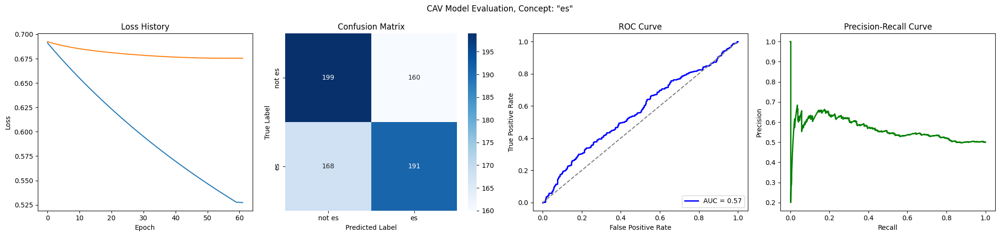

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7033
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6683
Epoch 11 Validation Loss: 0.6828
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6408
Epoch 21 Validation Loss: 0.6751
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6155
Epoch 31 Validation Loss: 0.6712
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5925
Epoch 41 Validation Loss: 0.6687
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5714
Epoch 51 Validation Loss: 0.6665
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5520
Epoch 61 Validation Loss: 0.6650
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5340
Epoch 71 Validation Loss: 0.6638
Model saved to trai

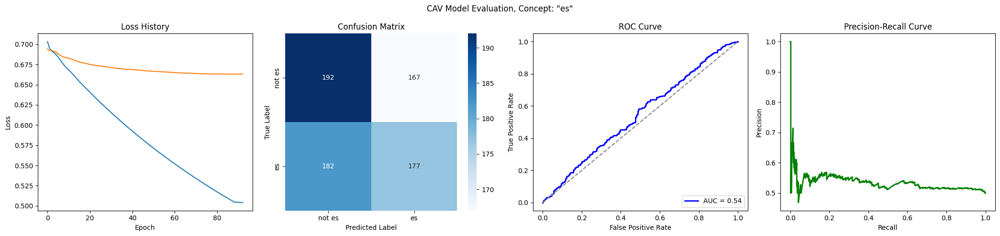

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6582
Epoch 11 Validation Loss: 0.6782
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6264
Epoch 21 Validation Loss: 0.6696
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5982
Epoch 31 Validation Loss: 0.6648
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5732
Epoch 41 Validation Loss: 0.6619
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5507
Epoch 51 Validation Loss: 0.6599
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5304
Epoch 61 Validation Loss: 0.6589
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5120
Epoch 71 Validation Loss: 0.6586
Early stopping at e

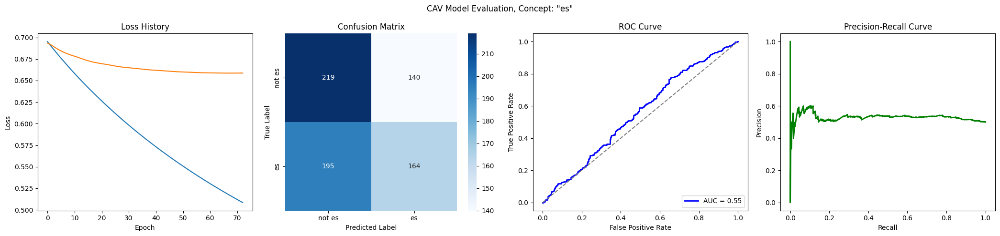

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6651
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6378
Epoch 21 Validation Loss: 0.6713
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6138
Epoch 31 Validation Loss: 0.6668
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5920
Epoch 41 Validation Loss: 0.6643
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5719
Epoch 51 Validation Loss: 0.6628
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5533
Epoch 61 Validation Loss: 0.6613
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5359
Epoch 71 Validation Loss: 0.6600
Model saved to trai

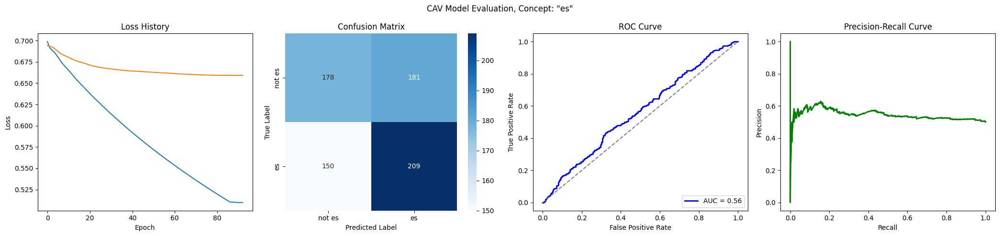

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6660
Epoch 11 Validation Loss: 0.6810
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6397
Epoch 21 Validation Loss: 0.6722
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6159
Epoch 31 Validation Loss: 0.6659
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5942
Epoch 41 Validation Loss: 0.6607
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5744
Epoch 51 Validation Loss: 0.6561
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5561
Epoch 61 Validation Loss: 0.6521
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5393
Epoch 71 Validation Loss: 0.6489
Model saved to trai

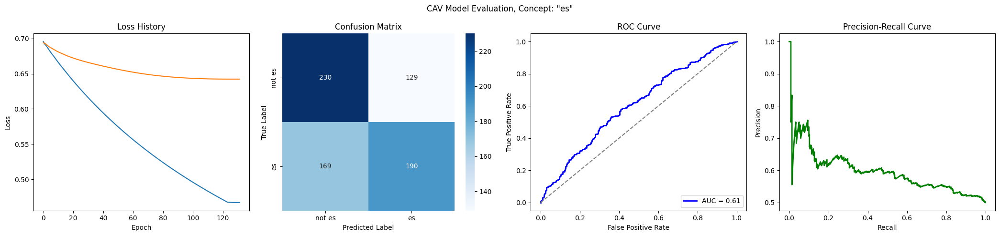

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6740
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6198
Epoch 21 Validation Loss: 0.6669
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5913
Epoch 31 Validation Loss: 0.6634
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5662
Epoch 41 Validation Loss: 0.6614
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5438
Epoch 51 Validation Loss: 0.6596
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5235
Epoch 61 Validation Loss: 0.6578
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5050
Epoch 71 Validation Loss: 0.6563
Model saved to trai

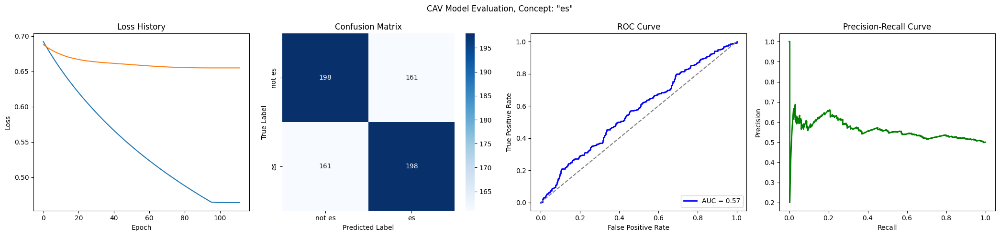

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6179
Epoch 21 Validation Loss: 0.6731
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5866
Epoch 31 Validation Loss: 0.6686
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5589
Epoch 41 Validation Loss: 0.6659
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5341
Epoch 51 Validation Loss: 0.6641
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5118
Epoch 61 Validation Loss: 0.6630
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4916
Epoch 71 Validation Loss: 0.6627
Early stopping at e

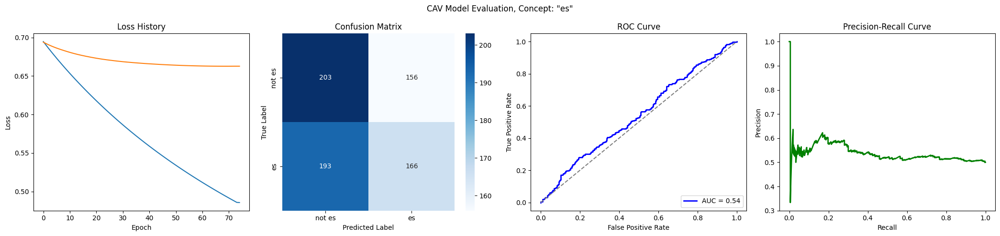

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6679
Epoch 11 Validation Loss: 0.6883
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6426
Epoch 21 Validation Loss: 0.6836
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6191
Epoch 31 Validation Loss: 0.6798
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5977
Epoch 41 Validation Loss: 0.6762
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5781
Epoch 51 Validation Loss: 0.6729
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5601
Epoch 61 Validation Loss: 0.6700
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5434
Epoch 71 Validation Loss: 0.6677
Model saved to trai

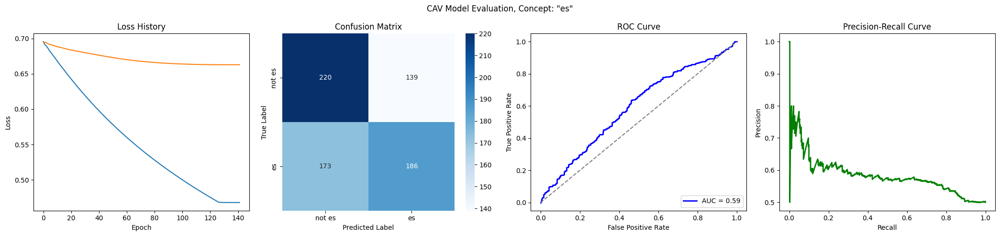

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6810
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6242
Epoch 21 Validation Loss: 0.6781
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5957
Epoch 31 Validation Loss: 0.6778
Early stopping at epoch 34
Loss history saved to trainings/language_es/loss_history.json


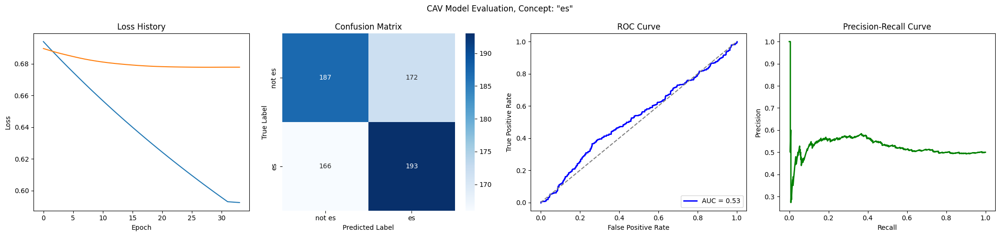

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6895
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6178
Epoch 21 Validation Loss: 0.6811
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5899
Epoch 31 Validation Loss: 0.6800
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/language_es/loss_history.json


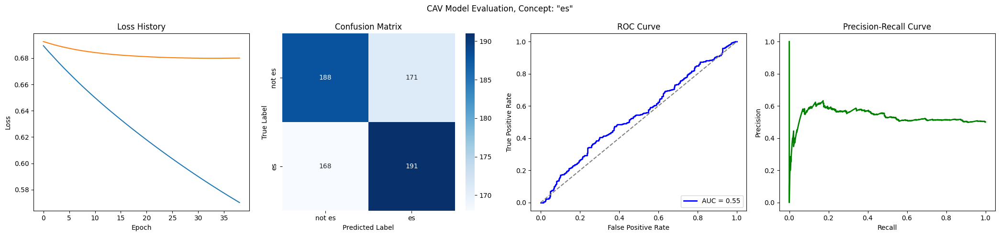

Training run 23/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6572
Epoch 11 Validation Loss: 0.6845
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6281
Epoch 21 Validation Loss: 0.6814
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6025
Epoch 31 Validation Loss: 0.6775
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5792
Epoch 41 Validation Loss: 0.6735
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5582
Epoch 51 Validation Loss: 0.6705
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5390
Epoch 61 Validation Loss: 0.6689
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5214
Epoch 71 Validation Loss: 0.6681
Model saved to trai

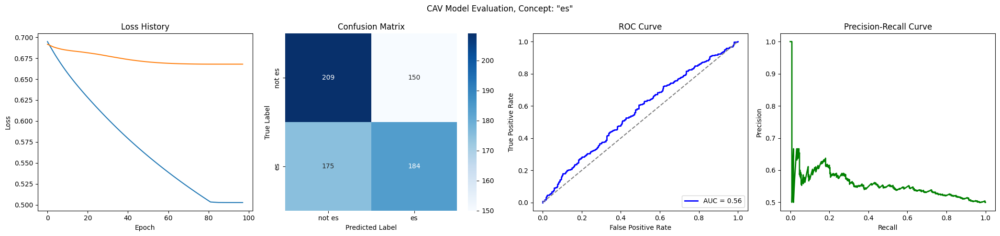

Training run 24/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6879
Early stopping at epoch 14
Loss history saved to trainings/language_es/loss_history.json


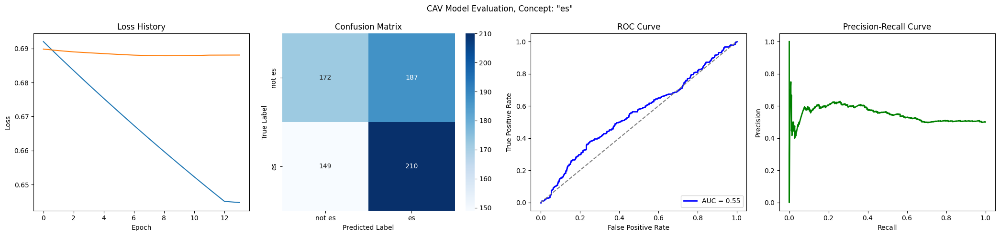

Training run 25/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6611
Epoch 11 Validation Loss: 0.6824
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6331
Epoch 21 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6081
Epoch 31 Validation Loss: 0.6751
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5855
Epoch 41 Validation Loss: 0.6743
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5651
Epoch 51 Validation Loss: 0.6739
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5585
Epoch 61 Validation Loss: 0.6739
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5584
Epoch 71 Validation Loss: 0.6739
Early stopping at e

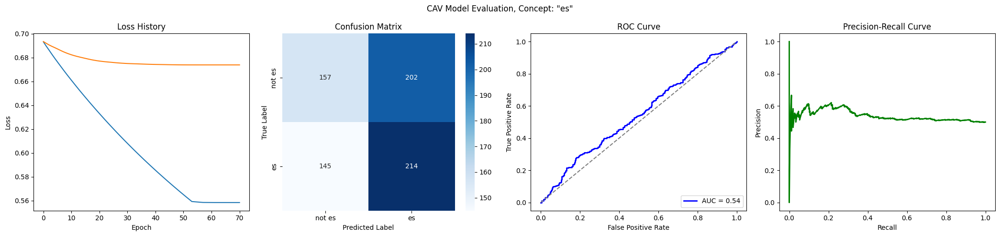

Training run 26/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6904
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6493
Epoch 11 Validation Loss: 0.6758
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6149
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5849
Epoch 31 Validation Loss: 0.6650
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5583
Epoch 41 Validation Loss: 0.6635
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5345
Epoch 51 Validation Loss: 0.6627
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5129
Epoch 61 Validation Loss: 0.6622
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4934
Epoch 71 Validation Loss: 0.6621
Early stopping at e

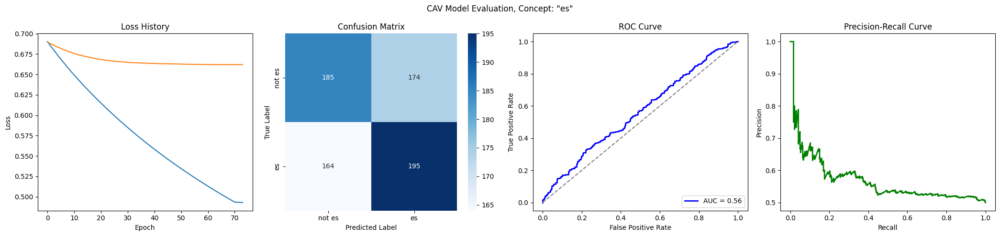

Training run 27/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6947
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6602
Epoch 11 Validation Loss: 0.6931
Early stopping at epoch 14
Loss history saved to trainings/language_es/loss_history.json


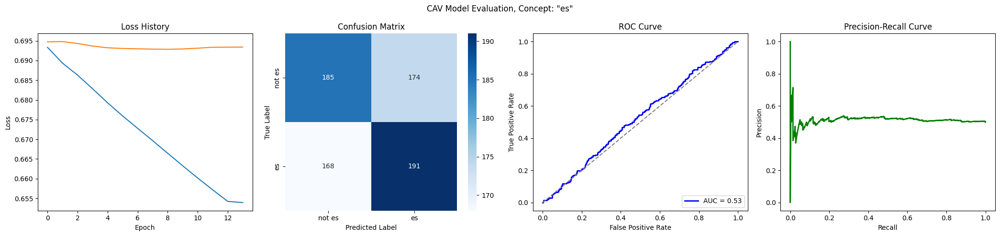

Training run 28/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7046
Epoch 1 Validation Loss: 0.6974
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6733
Epoch 11 Validation Loss: 0.6894
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6510
Epoch 21 Validation Loss: 0.6845
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6298
Epoch 31 Validation Loss: 0.6822
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6101
Epoch 41 Validation Loss: 0.6812
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5918
Epoch 51 Validation Loss: 0.6807
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5746
Epoch 61 Validation Loss: 0.6799
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5586
Epoch 71 Validation Loss: 0.6790
Model saved to trai

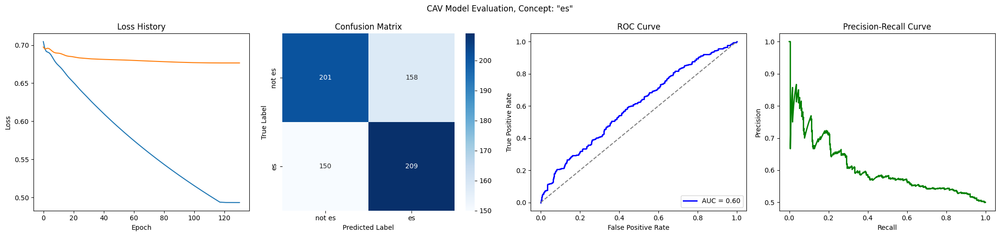

Training run 29/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7008
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6641
Epoch 11 Validation Loss: 0.6870
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6355
Epoch 21 Validation Loss: 0.6849
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6107
Epoch 31 Validation Loss: 0.6845
Early stopping at epoch 33
Loss history saved to trainings/language_es/loss_history.json


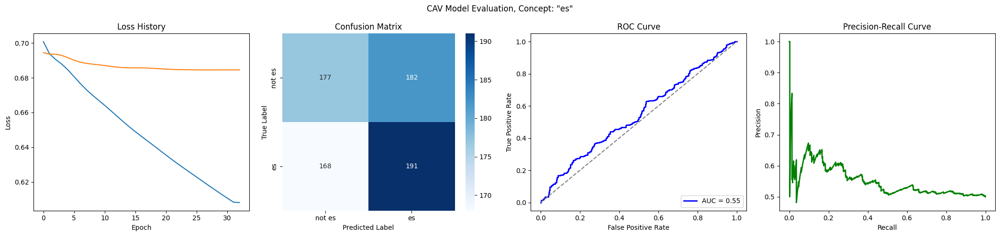

Training run 30/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6546
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6230
Epoch 21 Validation Loss: 0.6714
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5964
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5727
Epoch 41 Validation Loss: 0.6642
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5513
Epoch 51 Validation Loss: 0.6602
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5319
Epoch 61 Validation Loss: 0.6570
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5141
Epoch 71 Validation Loss: 0.6545
Model saved to trai

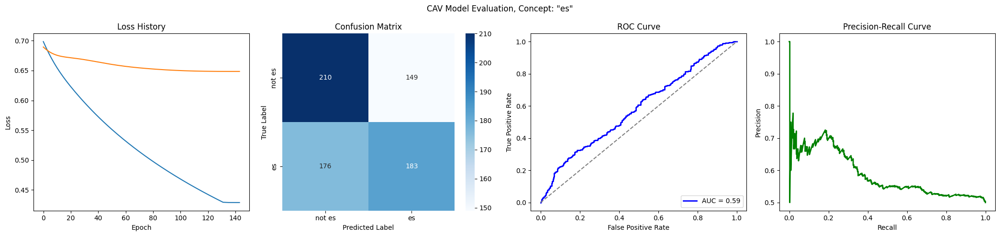

Training run 31/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6814
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6260
Epoch 21 Validation Loss: 0.6762
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5975
Epoch 31 Validation Loss: 0.6735
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5723
Epoch 41 Validation Loss: 0.6720
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5496
Epoch 51 Validation Loss: 0.6713
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/language_es/loss_history.json


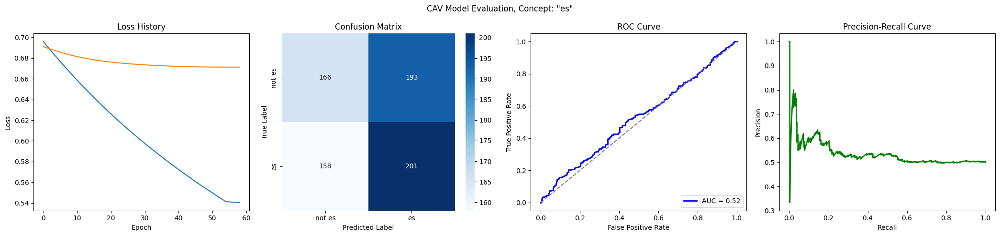

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7064
Epoch 1 Validation Loss: 0.6976
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6726
Epoch 11 Validation Loss: 0.6859
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6480
Epoch 21 Validation Loss: 0.6795
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6252
Epoch 31 Validation Loss: 0.6751
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6040
Epoch 41 Validation Loss: 0.6738
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5861
Epoch 51 Validation Loss: 0.6732
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5850
Epoch 61 Validation Loss: 0.6732
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 70
Loss history saved to trainings/language_es/loss_history.json


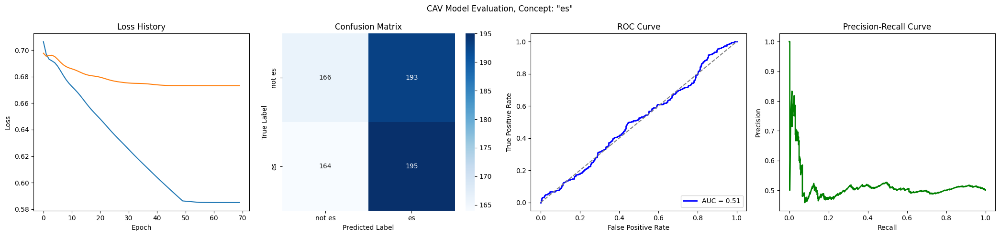

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6612
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6341
Epoch 21 Validation Loss: 0.6791
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6102
Epoch 31 Validation Loss: 0.6763
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5887
Epoch 41 Validation Loss: 0.6742
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5692
Epoch 51 Validation Loss: 0.6729
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5528
Epoch 61 Validation Loss: 0.6726
Early stopping at epoch 63
Loss history saved to trainings/language_es/loss_history.json


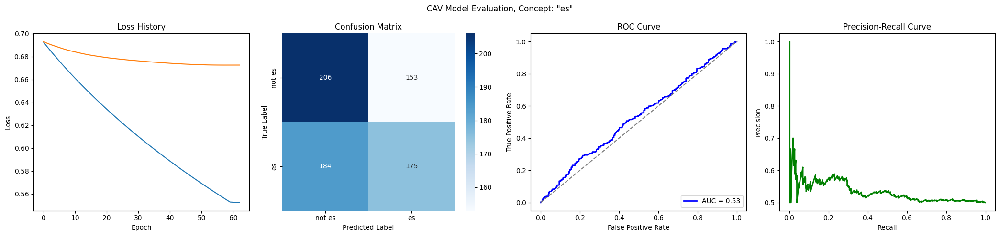

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6951
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6632
Epoch 11 Validation Loss: 0.6917
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6336
Epoch 21 Validation Loss: 0.6905
Early stopping at epoch 25
Loss history saved to trainings/language_es/loss_history.json


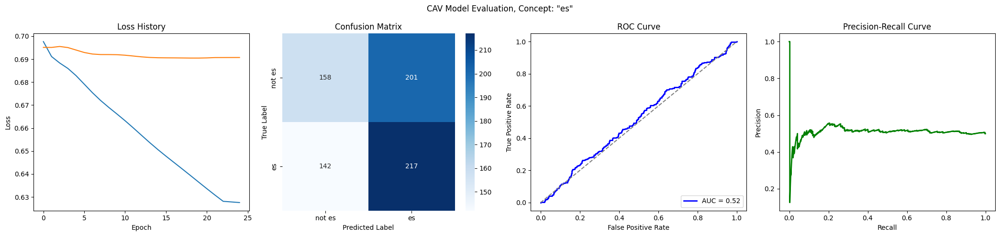

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6617
Epoch 11 Validation Loss: 0.6781
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6321
Epoch 21 Validation Loss: 0.6719
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6061
Epoch 31 Validation Loss: 0.6680
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5828
Epoch 41 Validation Loss: 0.6651
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5618
Epoch 51 Validation Loss: 0.6627
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5426
Epoch 61 Validation Loss: 0.6607
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5250
Epoch 71 Validation Loss: 0.6592
Model saved to trai

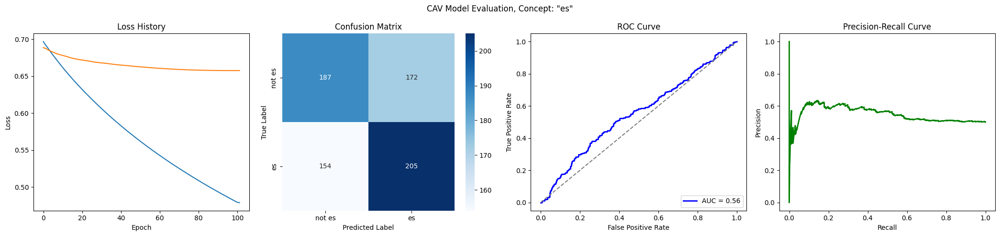

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6169
Epoch 21 Validation Loss: 0.6760
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5882
Epoch 31 Validation Loss: 0.6749
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5630
Epoch 41 Validation Loss: 0.6738
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5406
Epoch 51 Validation Loss: 0.6728
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5205
Epoch 61 Validation Loss: 0.6720
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5021
Epoch 71 Validation Loss: 0.6717
Model saved to trai

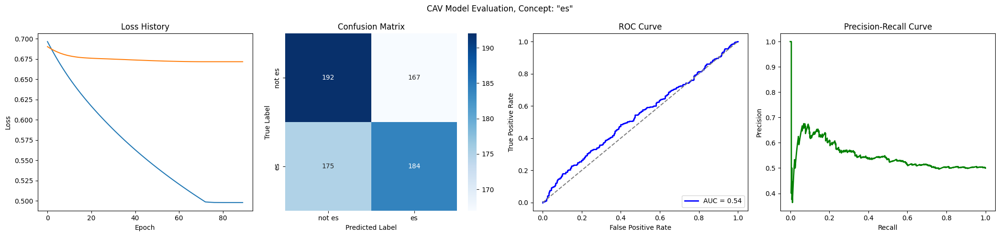

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6485
Epoch 11 Validation Loss: 0.6895
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/language_es/loss_history.json


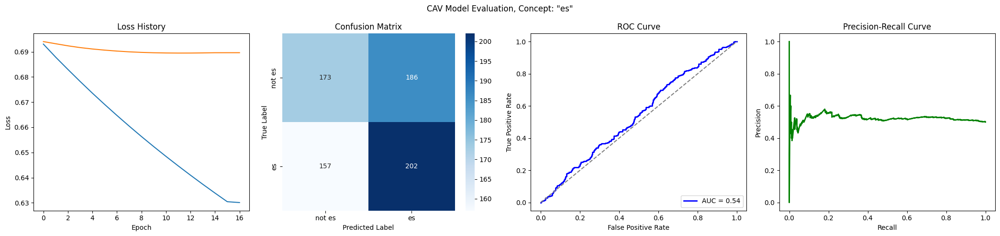

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6638
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6368
Epoch 21 Validation Loss: 0.6768
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6126
Epoch 31 Validation Loss: 0.6708
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5908
Epoch 41 Validation Loss: 0.6659
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5709
Epoch 51 Validation Loss: 0.6618
Model saved to trainings/language_es/state_dict.pth


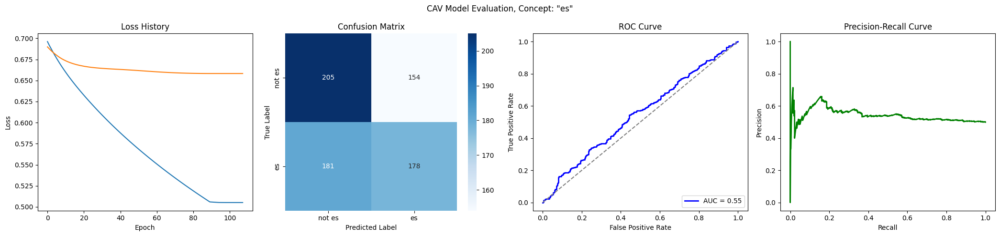

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6648
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6380
Epoch 21 Validation Loss: 0.6829
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6142
Epoch 31 Validation Loss: 0.6817
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 39
Loss history saved to trainings/language_es/loss_history.json


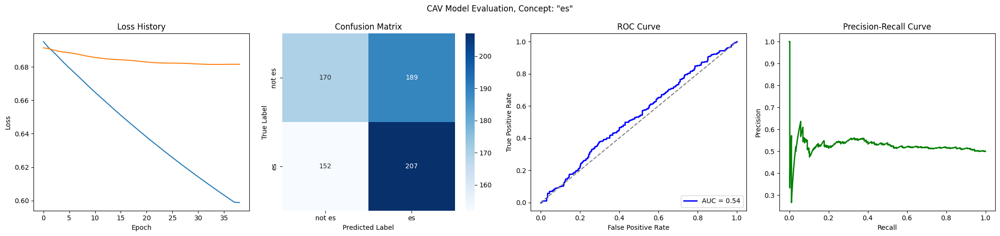

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6607
Epoch 11 Validation Loss: 0.6887
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6318
Epoch 21 Validation Loss: 0.6879
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6252
Epoch 31 Validation Loss: 0.6879
Early stopping at epoch 39
Loss history saved to trainings/language_es/loss_history.json


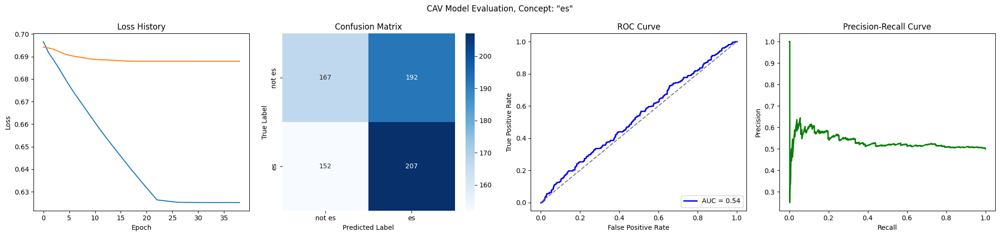

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6535
Epoch 11 Validation Loss: 0.6830
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6230
Epoch 21 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5960
Epoch 31 Validation Loss: 0.6705
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5715
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5492
Epoch 51 Validation Loss: 0.6589
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5286
Epoch 61 Validation Loss: 0.6554
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5095
Epoch 71 Validation Loss: 0.6528
Model saved to trai

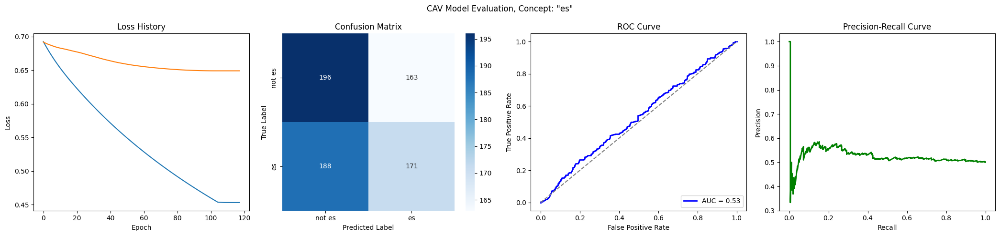

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6612
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6349
Epoch 21 Validation Loss: 0.6704
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6113
Epoch 31 Validation Loss: 0.6647
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5899
Epoch 41 Validation Loss: 0.6598
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5703
Epoch 51 Validation Loss: 0.6554
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5522
Epoch 61 Validation Loss: 0.6515
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5354
Epoch 71 Validation Loss: 0.6483
Model saved to trai

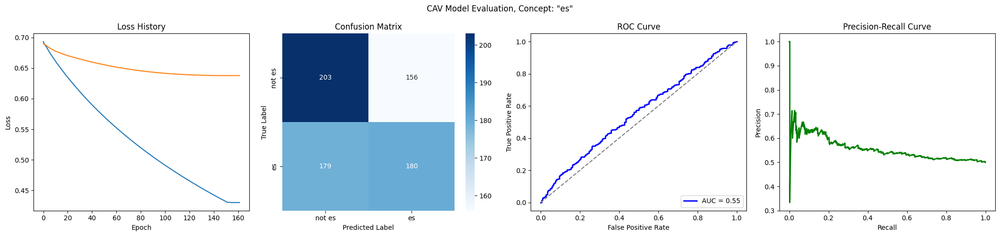

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6851
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6255
Epoch 21 Validation Loss: 0.6833
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5989
Epoch 31 Validation Loss: 0.6814
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5754
Epoch 41 Validation Loss: 0.6792
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5545
Epoch 51 Validation Loss: 0.6776
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5355
Epoch 61 Validation Loss: 0.6765
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5181
Epoch 71 Validation Loss: 0.6759
Model saved to trai

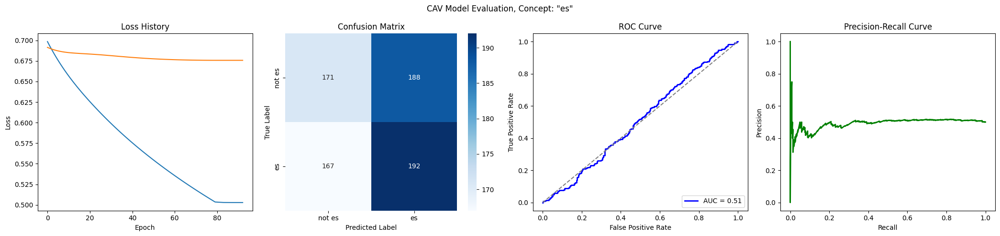

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6967
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6586
Epoch 11 Validation Loss: 0.6897
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6304
Epoch 21 Validation Loss: 0.6893
Early stopping at epoch 21
Loss history saved to trainings/language_es/loss_history.json


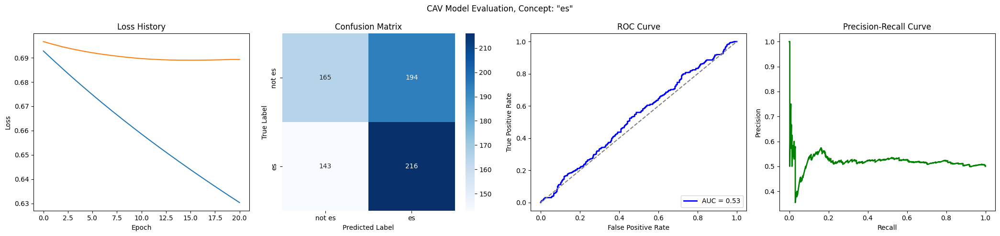

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6517
Epoch 11 Validation Loss: 0.6869
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6198
Epoch 21 Validation Loss: 0.6861
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 26
Loss history saved to trainings/language_es/loss_history.json


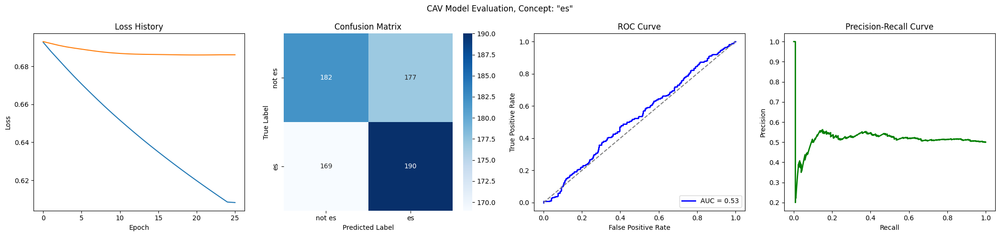

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/language_es/loss_history.json


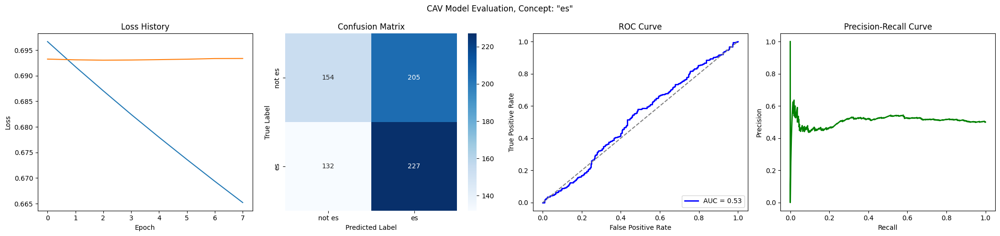

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6610
Epoch 11 Validation Loss: 0.6849
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6343
Epoch 21 Validation Loss: 0.6818
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6109
Epoch 31 Validation Loss: 0.6801
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5894
Epoch 41 Validation Loss: 0.6778
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5698
Epoch 51 Validation Loss: 0.6758
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5518
Epoch 61 Validation Loss: 0.6746
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5352
Epoch 71 Validation Loss: 0.6741
Model saved to trai

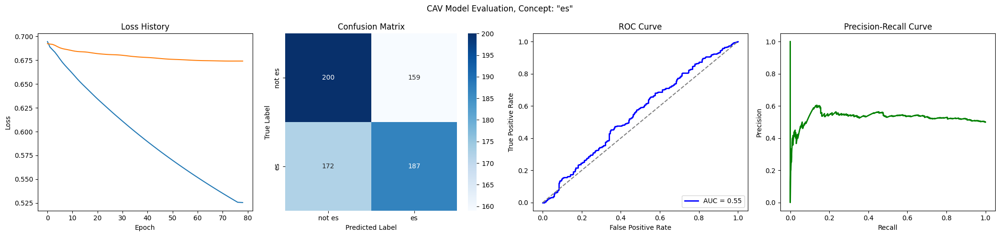

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6999
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6634
Epoch 11 Validation Loss: 0.6837
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6337
Epoch 21 Validation Loss: 0.6785
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6082
Epoch 31 Validation Loss: 0.6762
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5853
Epoch 41 Validation Loss: 0.6751
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5647
Epoch 51 Validation Loss: 0.6745
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5599
Epoch 61 Validation Loss: 0.6745
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5599
Epoch 71 Validation Loss: 0.6745
Early stopping at e

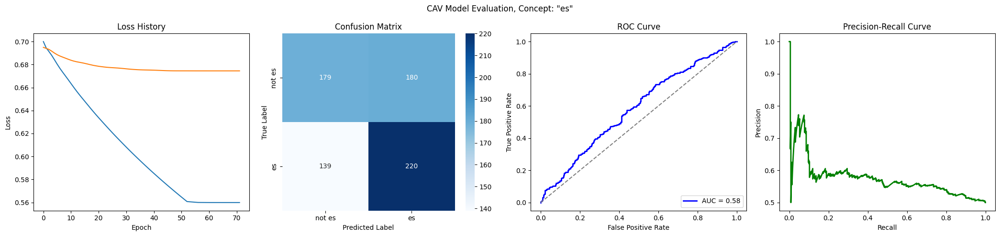

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6652
Epoch 11 Validation Loss: 0.6947
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6382
Epoch 21 Validation Loss: 0.6923
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6137
Epoch 31 Validation Loss: 0.6901
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5913
Epoch 41 Validation Loss: 0.6886
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5707
Epoch 51 Validation Loss: 0.6875
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5515
Epoch 61 Validation Loss: 0.6864
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5337
Epoch 71 Validation Loss: 0.6855
Model saved to trai

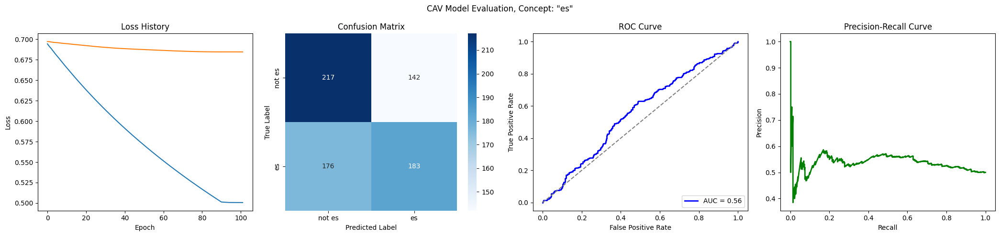

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7017
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6635
Epoch 11 Validation Loss: 0.6876
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6382
Epoch 21 Validation Loss: 0.6876
Early stopping at epoch 21
Loss history saved to trainings/language_es/loss_history.json


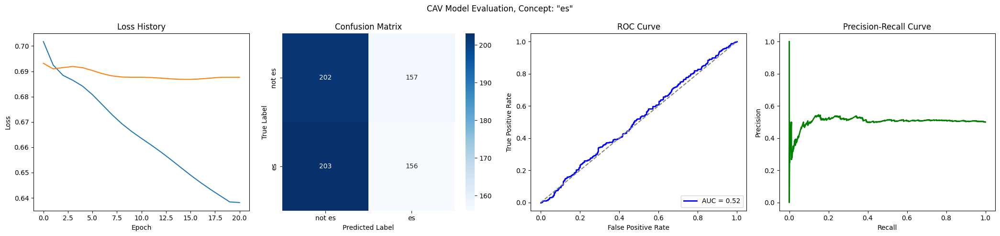

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6831
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6271
Epoch 21 Validation Loss: 0.6776
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5986
Epoch 31 Validation Loss: 0.6730
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5732
Epoch 41 Validation Loss: 0.6687
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5503
Epoch 51 Validation Loss: 0.6650
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5296
Epoch 61 Validation Loss: 0.6621
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5107
Epoch 71 Validation Loss: 0.6600
Model saved to trai

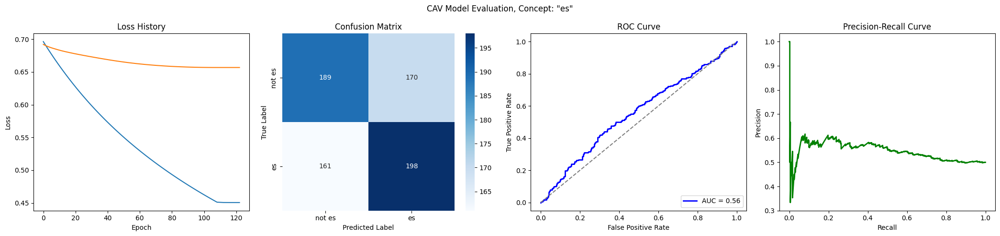

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6891
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6463
Epoch 11 Validation Loss: 0.6913
Early stopping at epoch 12
Loss history saved to trainings/language_es/loss_history.json


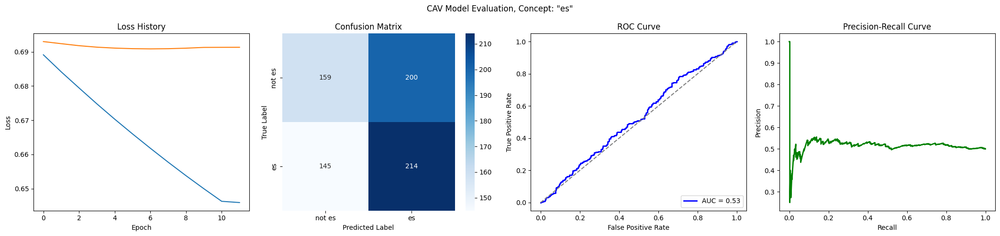

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6638
Epoch 11 Validation Loss: 0.6826
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6339
Epoch 21 Validation Loss: 0.6776
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6068
Epoch 31 Validation Loss: 0.6746
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5823
Epoch 41 Validation Loss: 0.6726
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5601
Epoch 51 Validation Loss: 0.6711
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5399
Epoch 61 Validation Loss: 0.6702
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5247
Epoch 71 Validation Loss: 0.6700
Epoch 81/500
Epoch 

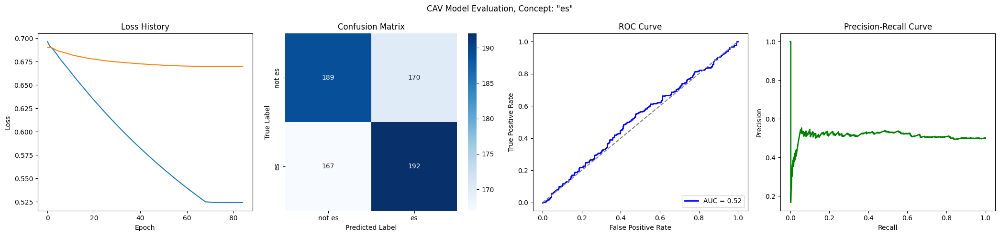

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6653
Epoch 11 Validation Loss: 0.6858
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6398
Epoch 21 Validation Loss: 0.6832
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6173
Epoch 31 Validation Loss: 0.6806
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5967
Epoch 41 Validation Loss: 0.6774
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5778
Epoch 51 Validation Loss: 0.6737
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5602
Epoch 61 Validation Loss: 0.6699
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5437
Epoch 71 Validation Loss: 0.6666
Model saved to trai

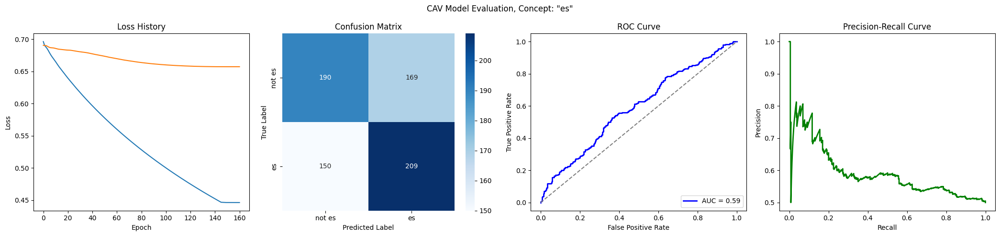

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7011
Epoch 1 Validation Loss: 0.6987
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6592
Epoch 11 Validation Loss: 0.6926
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 18
Loss history saved to trainings/language_es/loss_history.json


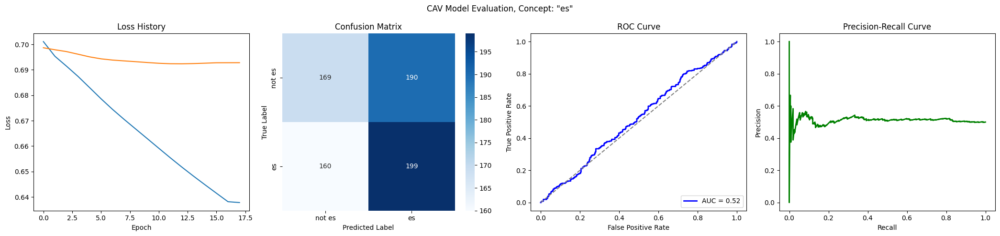

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6931
Early stopping at epoch 12
Loss history saved to trainings/language_es/loss_history.json


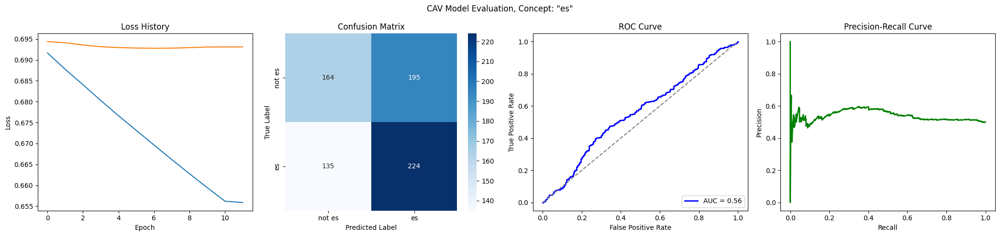

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6610
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6299
Epoch 21 Validation Loss: 0.6804
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6027
Epoch 31 Validation Loss: 0.6790
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5789
Epoch 41 Validation Loss: 0.6782
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5576
Epoch 51 Validation Loss: 0.6774
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5385
Epoch 61 Validation Loss: 0.6767
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5211
Epoch 71 Validation Loss: 0.6762
Model saved to trai

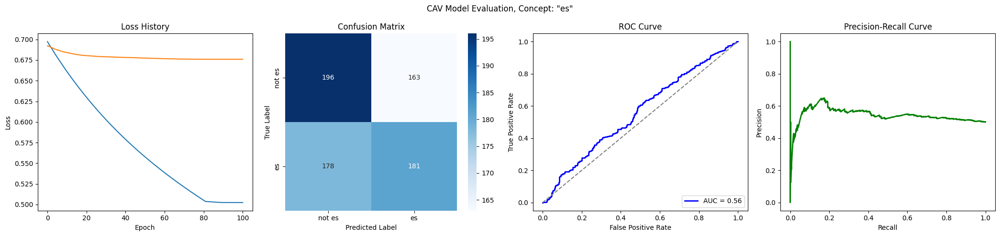

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6621
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6330
Epoch 21 Validation Loss: 0.6730
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6074
Epoch 31 Validation Loss: 0.6661
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5842
Epoch 41 Validation Loss: 0.6596
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5632
Epoch 51 Validation Loss: 0.6539
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5440
Epoch 61 Validation Loss: 0.6495
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5263
Epoch 71 Validation Loss: 0.6462
Model saved to trai

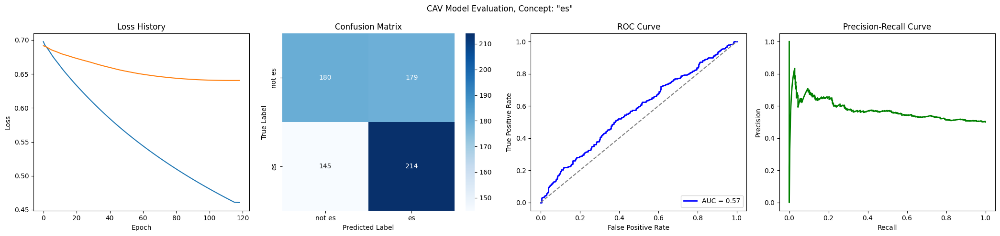

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6950
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6600
Epoch 11 Validation Loss: 0.6898
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/language_es/loss_history.json


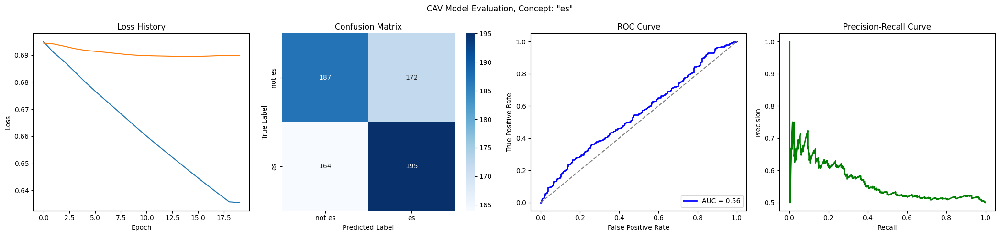

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6635
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6355
Epoch 21 Validation Loss: 0.6836
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6107
Epoch 31 Validation Loss: 0.6816
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5884
Epoch 41 Validation Loss: 0.6802
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5682
Epoch 51 Validation Loss: 0.6793
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5497
Epoch 61 Validation Loss: 0.6786
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5327
Epoch 71 Validation Loss: 0.6783
Model saved to trai

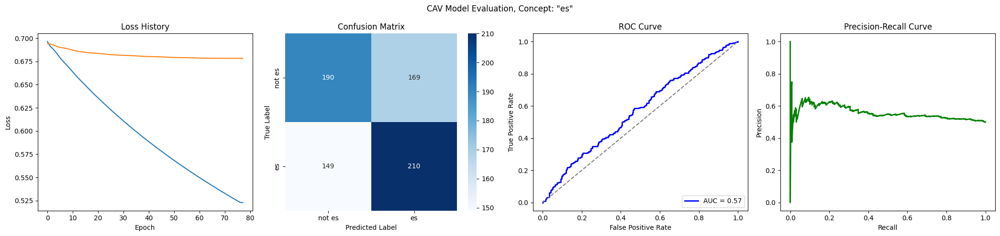

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6266
Epoch 21 Validation Loss: 0.6730
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5991
Epoch 31 Validation Loss: 0.6683
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5744
Epoch 41 Validation Loss: 0.6649
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5519
Epoch 51 Validation Loss: 0.6625
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5315
Epoch 61 Validation Loss: 0.6608
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5127
Epoch 71 Validation Loss: 0.6599
Model saved to trai

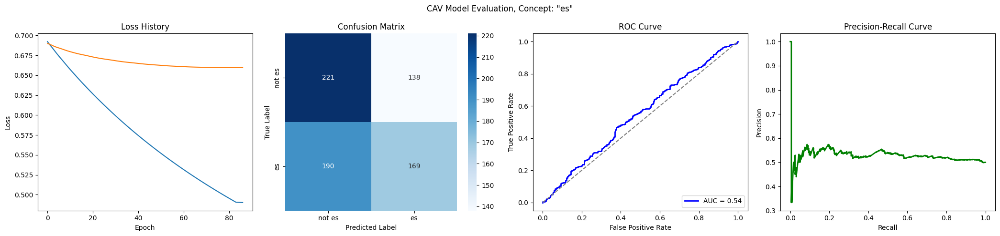

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6926
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6526
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6223
Epoch 21 Validation Loss: 0.6822
Early stopping at epoch 25
Loss history saved to trainings/language_es/loss_history.json


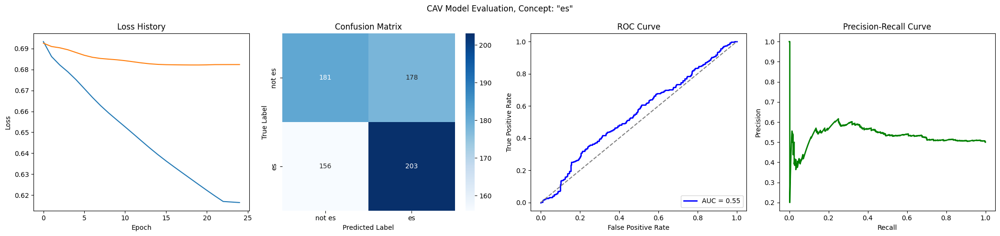

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6592
Epoch 11 Validation Loss: 0.6871
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6323
Epoch 21 Validation Loss: 0.6864
Early stopping at epoch 23
Loss history saved to trainings/language_es/loss_history.json


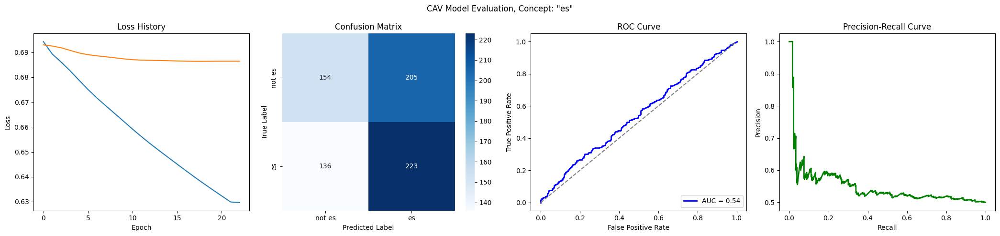

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6493
Epoch 11 Validation Loss: 0.6884
Early stopping at epoch 14
Loss history saved to trainings/language_es/loss_history.json


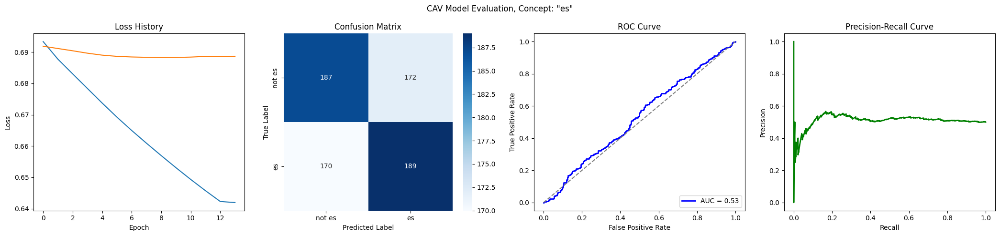

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6495
Epoch 11 Validation Loss: 0.6799
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6143
Epoch 21 Validation Loss: 0.6768
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 29
Loss history saved to trainings/language_es/loss_history.json


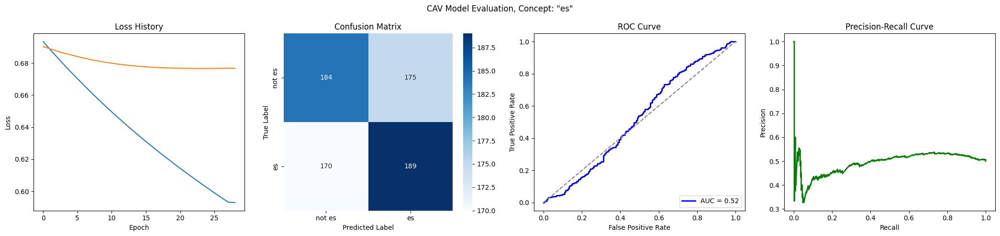

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6567
Epoch 11 Validation Loss: 0.6883
Early stopping at epoch 12
Loss history saved to trainings/language_es/loss_history.json


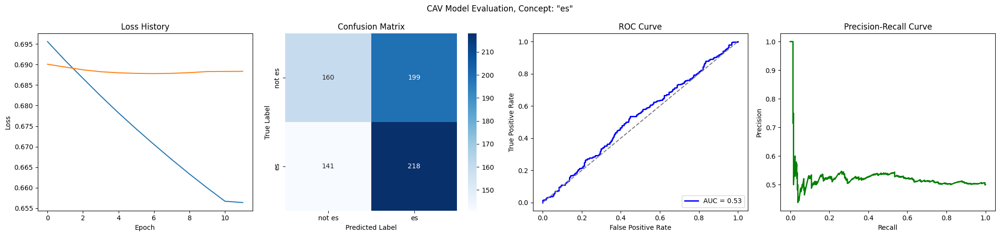

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6608
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6294
Epoch 21 Validation Loss: 0.6847
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6020
Epoch 31 Validation Loss: 0.6838
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 38
Loss history saved to trainings/language_es/loss_history.json


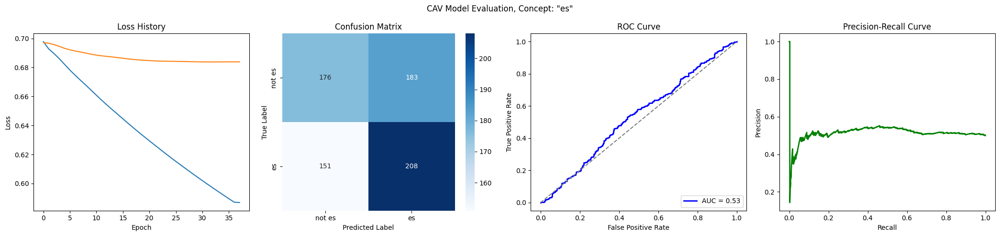

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6587
Epoch 11 Validation Loss: 0.6863
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6316
Epoch 21 Validation Loss: 0.6827
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6075
Epoch 31 Validation Loss: 0.6810
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5857
Epoch 41 Validation Loss: 0.6801
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5659
Epoch 51 Validation Loss: 0.6792
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5477
Epoch 61 Validation Loss: 0.6786
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5308
Epoch 71 Validation Loss: 0.6782
Model saved to trai

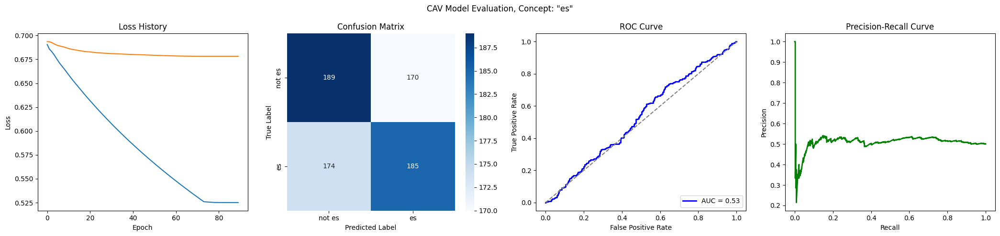

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6591
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6284
Epoch 21 Validation Loss: 0.6789
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6018
Epoch 31 Validation Loss: 0.6759
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5775
Epoch 41 Validation Loss: 0.6725
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5554
Epoch 51 Validation Loss: 0.6693
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5351
Epoch 61 Validation Loss: 0.6668
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5164
Epoch 71 Validation Loss: 0.6649
Model saved to trai

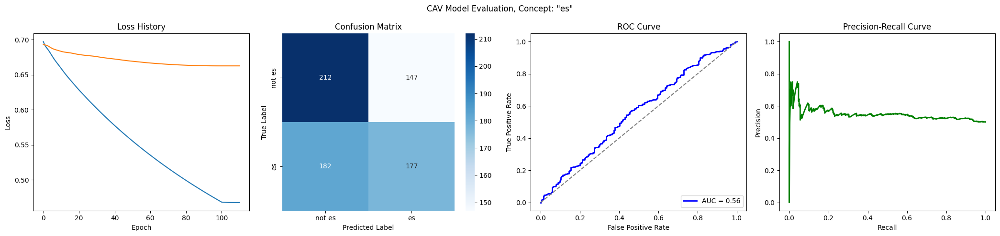

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/language_es/loss_history.json


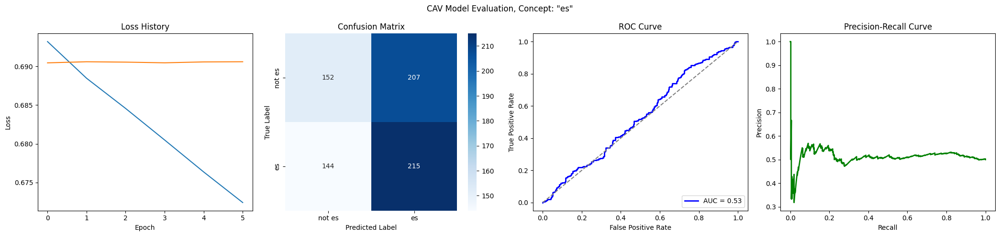

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6972
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6650
Epoch 11 Validation Loss: 0.6883
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 19
Loss history saved to trainings/language_es/loss_history.json


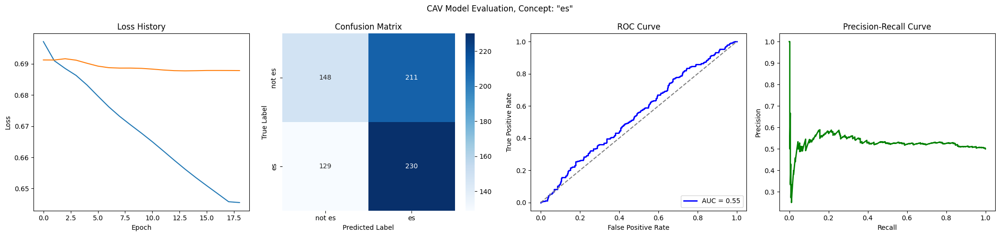

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6920
Epoch 1 Validation Loss: 0.6979
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6874
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6223
Epoch 21 Validation Loss: 0.6861
Early stopping at epoch 23
Loss history saved to trainings/language_es/loss_history.json


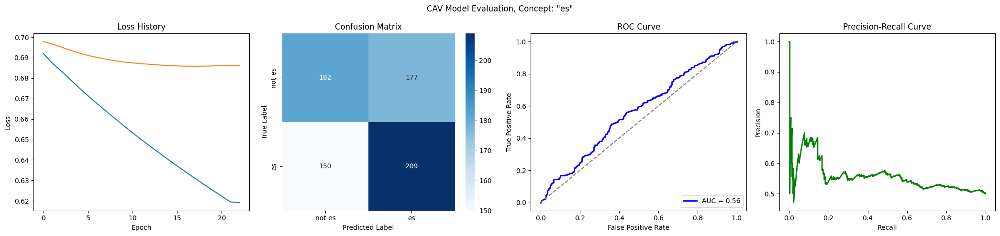

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6704
Epoch 11 Validation Loss: 0.6763
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6471
Epoch 21 Validation Loss: 0.6688
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6257
Epoch 31 Validation Loss: 0.6643
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6060
Epoch 41 Validation Loss: 0.6614
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5878
Epoch 51 Validation Loss: 0.6593
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5707
Epoch 61 Validation Loss: 0.6578
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5547
Epoch 71 Validation Loss: 0.6568
Model saved to trai

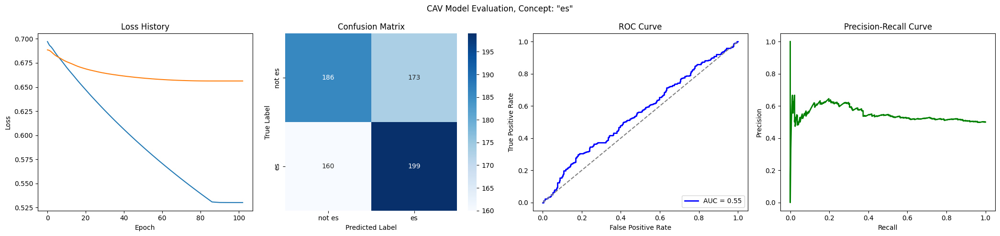

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6648
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6382
Epoch 21 Validation Loss: 0.6688
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6149
Epoch 31 Validation Loss: 0.6641
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5935
Epoch 41 Validation Loss: 0.6609
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5740
Epoch 51 Validation Loss: 0.6585
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5561
Epoch 61 Validation Loss: 0.6565
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5396
Epoch 71 Validation Loss: 0.6548
Model saved to trai

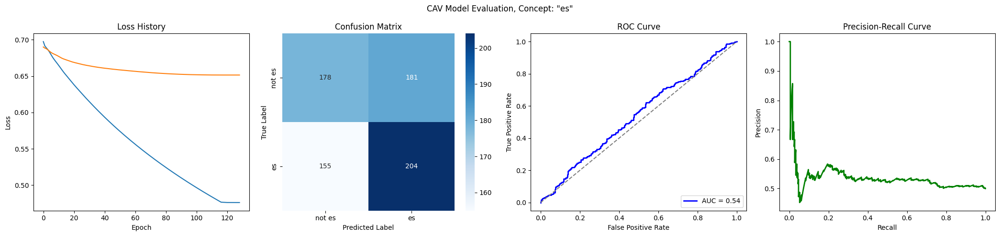

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7094
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6675
Epoch 11 Validation Loss: 0.6783
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6427
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6212
Epoch 31 Validation Loss: 0.6639
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6016
Epoch 41 Validation Loss: 0.6611
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5835
Epoch 51 Validation Loss: 0.6599
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5666
Epoch 61 Validation Loss: 0.6591
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5508
Epoch 71 Validation Loss: 0.6585
Model saved to trai

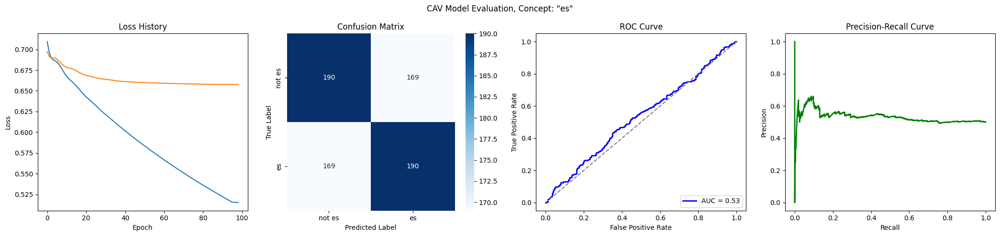

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6905
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6527
Epoch 11 Validation Loss: 0.6864
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6203
Epoch 21 Validation Loss: 0.6842
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5916
Epoch 31 Validation Loss: 0.6831
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5661
Epoch 41 Validation Loss: 0.6829
Early stopping at epoch 43
Loss history saved to trainings/language_es/loss_history.json


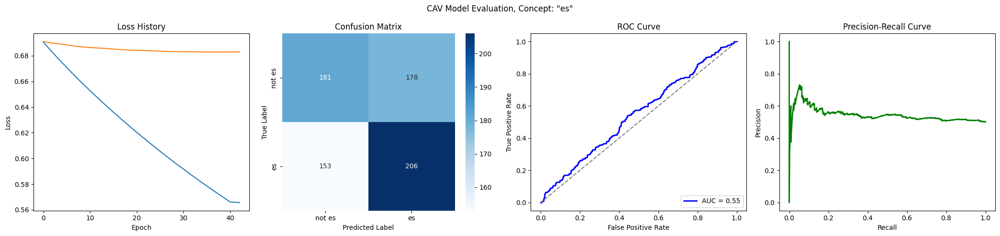

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6604
Epoch 11 Validation Loss: 0.6872
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6306
Epoch 21 Validation Loss: 0.6847
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6045
Epoch 31 Validation Loss: 0.6839
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5853
Epoch 41 Validation Loss: 0.6839
Early stopping at epoch 41
Loss history saved to trainings/language_es/loss_history.json


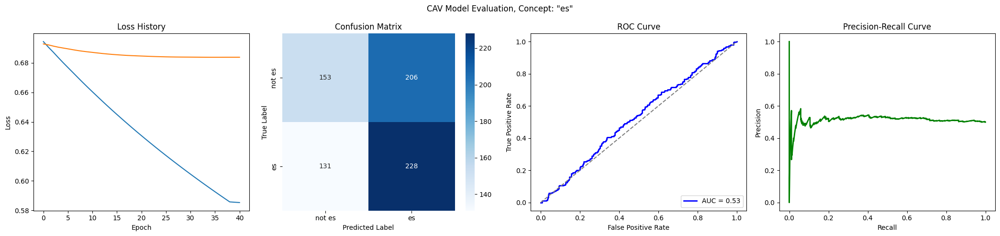

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/language_es/loss_history.json


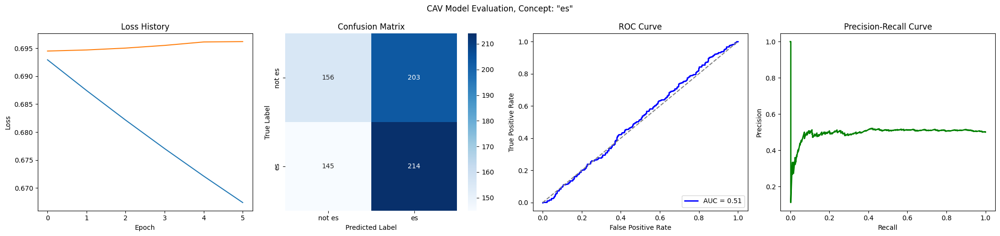

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6601
Epoch 11 Validation Loss: 0.6881
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6289
Epoch 21 Validation Loss: 0.6862
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6020
Epoch 31 Validation Loss: 0.6840
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5782
Epoch 41 Validation Loss: 0.6808
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5567
Epoch 51 Validation Loss: 0.6778
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5373
Epoch 61 Validation Loss: 0.6753
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5194
Epoch 71 Validation Loss: 0.6734
Model saved to trai

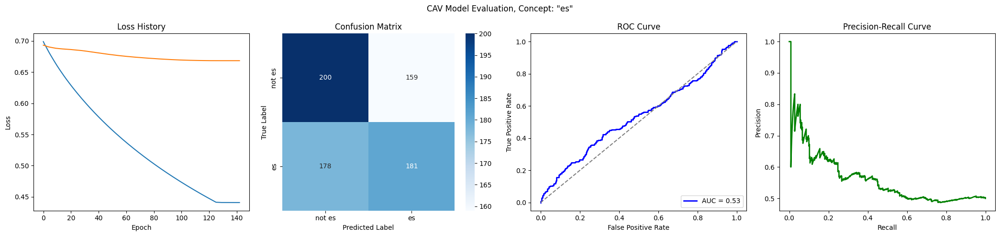

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6624
Epoch 11 Validation Loss: 0.6821
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6356
Epoch 21 Validation Loss: 0.6777
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6111
Epoch 31 Validation Loss: 0.6751
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5884
Epoch 41 Validation Loss: 0.6732
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5676
Epoch 51 Validation Loss: 0.6718
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5485
Epoch 61 Validation Loss: 0.6708
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5308
Epoch 71 Validation Loss: 0.6702
Model saved to trai

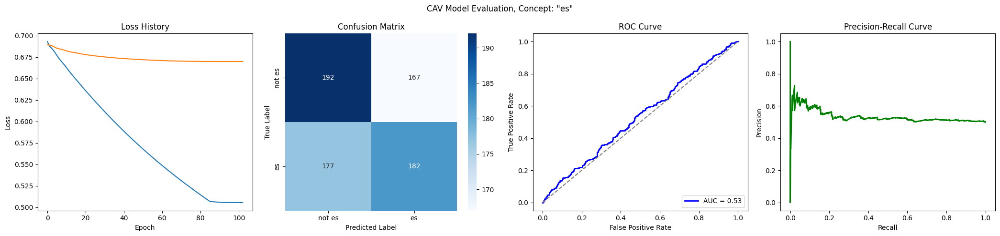

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6906
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6539
Epoch 11 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6230
Epoch 21 Validation Loss: 0.6695
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5955
Epoch 31 Validation Loss: 0.6646
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5709
Epoch 41 Validation Loss: 0.6593
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5485
Epoch 51 Validation Loss: 0.6527
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5280
Epoch 61 Validation Loss: 0.6462
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5091
Epoch 71 Validation Loss: 0.6406
Model saved to trai

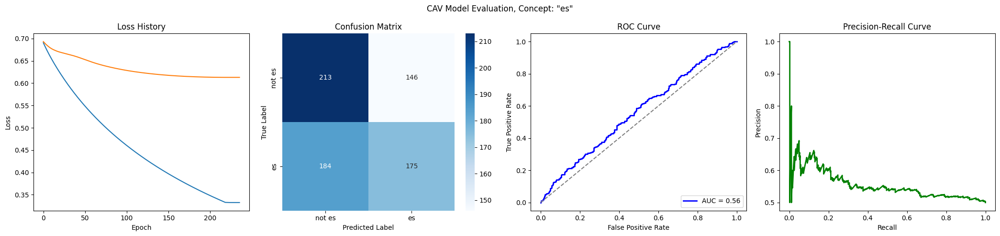

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6628
Epoch 11 Validation Loss: 0.6810
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6374
Epoch 21 Validation Loss: 0.6750
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6152
Epoch 31 Validation Loss: 0.6697
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5946
Epoch 41 Validation Loss: 0.6646
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5757
Epoch 51 Validation Loss: 0.6604
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5582
Epoch 61 Validation Loss: 0.6573
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5419
Epoch 71 Validation Loss: 0.6550
Model saved to trai

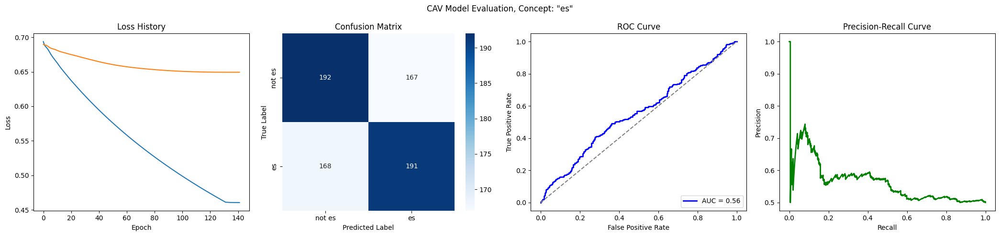

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6630
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/language_es/loss_history.json


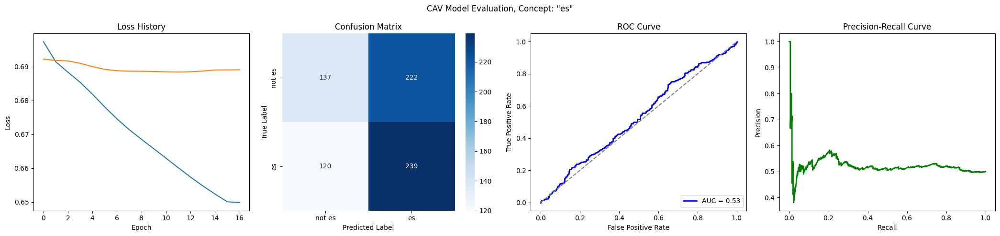

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6969
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6587
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6273
Epoch 21 Validation Loss: 0.6739
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6005
Epoch 31 Validation Loss: 0.6715
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5774
Epoch 41 Validation Loss: 0.6708
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5569
Epoch 51 Validation Loss: 0.6703
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5384
Epoch 61 Validation Loss: 0.6698
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5214
Epoch 71 Validation Loss: 0.6692
Model saved to trai

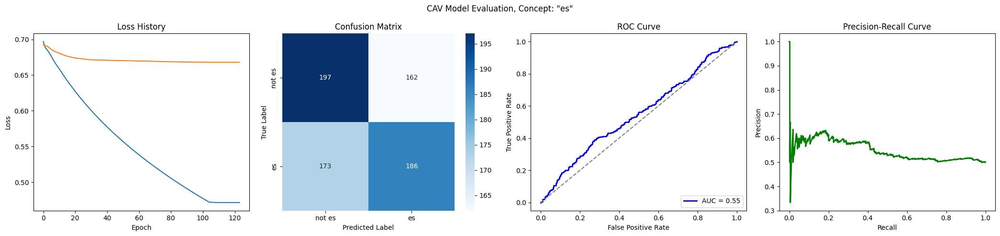

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6581
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6280
Epoch 21 Validation Loss: 0.6825
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6228
Epoch 31 Validation Loss: 0.6823
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6206
Epoch 41 Validation Loss: 0.6822
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 49
Loss history saved to trainings/language_es/loss_history.json


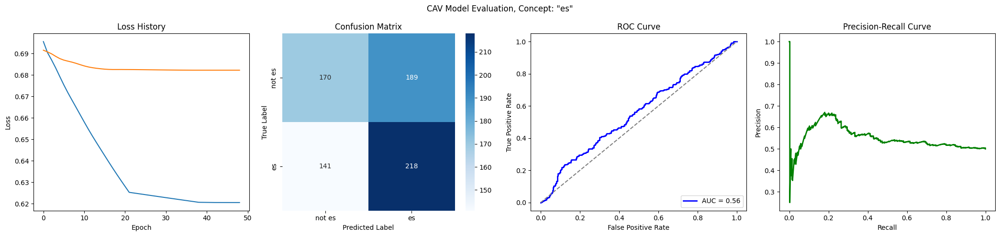

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6998
Epoch 1 Validation Loss: 0.6981
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6685
Epoch 11 Validation Loss: 0.6873
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6414
Epoch 21 Validation Loss: 0.6790
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6172
Epoch 31 Validation Loss: 0.6720
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5954
Epoch 41 Validation Loss: 0.6652
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5756
Epoch 51 Validation Loss: 0.6585
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5575
Epoch 61 Validation Loss: 0.6521
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5408
Epoch 71 Validation Loss: 0.6464
Model saved to trai

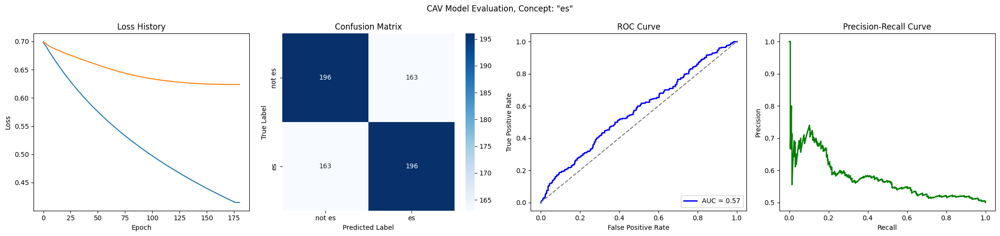

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6569
Epoch 11 Validation Loss: 0.6785
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6286
Epoch 21 Validation Loss: 0.6749
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6039
Epoch 31 Validation Loss: 0.6738
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5834
Epoch 41 Validation Loss: 0.6735
Epoch 51/500
Epoch 51 Train Loss: 0.5826
Epoch 51 Validation Loss: 0.6735
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/language_es/loss_history.json


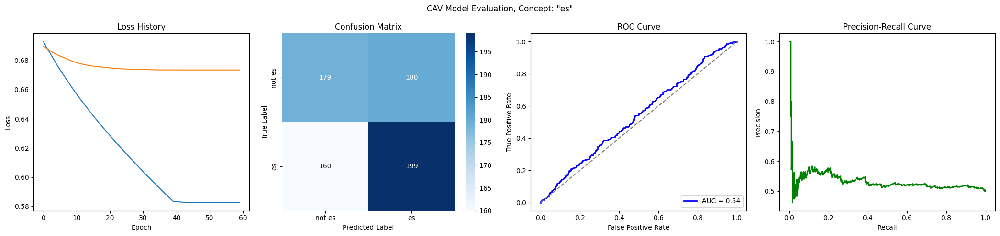

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6619
Epoch 11 Validation Loss: 0.6830
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6353
Epoch 21 Validation Loss: 0.6796
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6109
Epoch 31 Validation Loss: 0.6787
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5903
Epoch 41 Validation Loss: 0.6787
Early stopping at epoch 42
Loss history saved to trainings/language_es/loss_history.json


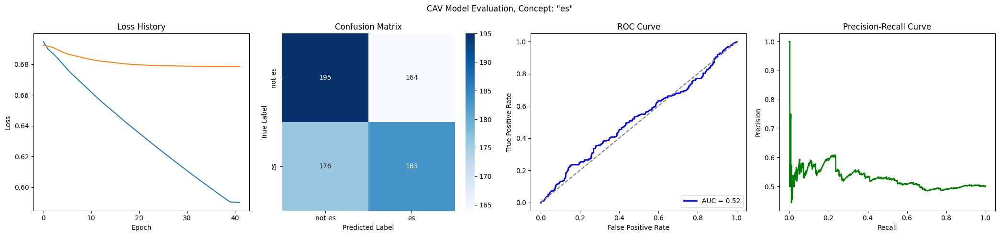

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6917
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6264
Epoch 21 Validation Loss: 0.6896
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5997
Epoch 31 Validation Loss: 0.6851
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5756
Epoch 41 Validation Loss: 0.6799
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5540
Epoch 51 Validation Loss: 0.6756
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5342
Epoch 61 Validation Loss: 0.6723
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5161
Epoch 71 Validation Loss: 0.6696
Model saved to trai

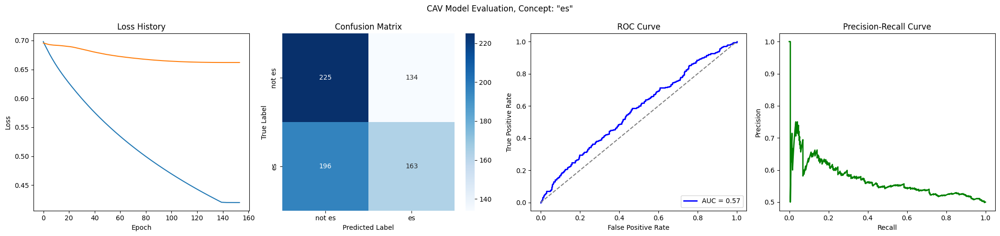

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6574
Epoch 11 Validation Loss: 0.6813
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6230
Epoch 21 Validation Loss: 0.6770
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5924
Epoch 31 Validation Loss: 0.6758
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/language_es/loss_history.json


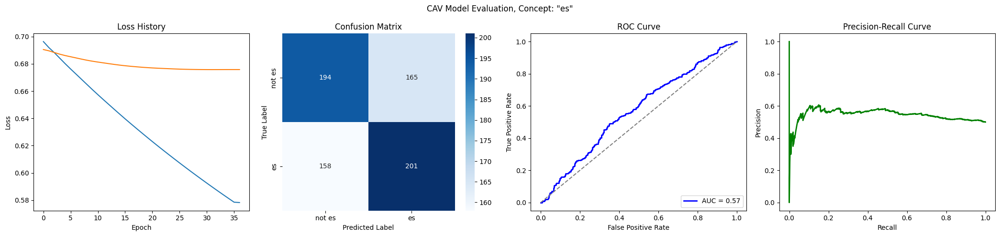

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6629
Epoch 11 Validation Loss: 0.6873
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6358
Epoch 21 Validation Loss: 0.6867
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6347
Epoch 31 Validation Loss: 0.6867
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.6347
Epoch 41 Validation Loss: 0.6867
Early stopping at epoch 41
Loss history saved to trainings/language_es/loss_history.json


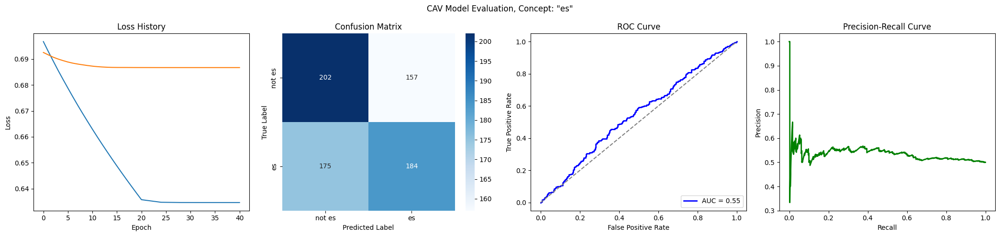

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6652
Epoch 11 Validation Loss: 0.6857
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6396
Epoch 21 Validation Loss: 0.6825
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6171
Epoch 31 Validation Loss: 0.6814
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5969
Epoch 41 Validation Loss: 0.6805
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5786
Epoch 51 Validation Loss: 0.6791
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5618
Epoch 61 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5462
Epoch 71 Validation Loss: 0.6751
Model saved to trai

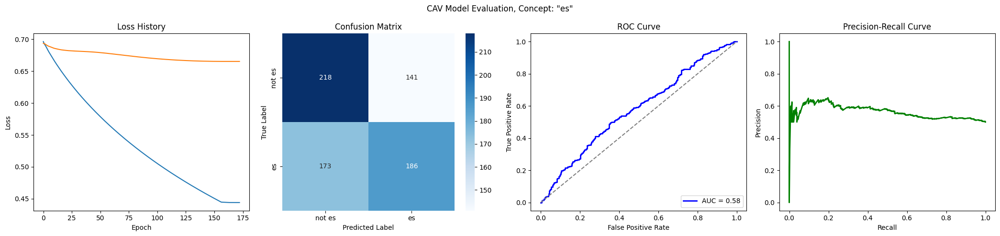

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6611
Epoch 11 Validation Loss: 0.6872
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6349
Epoch 21 Validation Loss: 0.6868
Early stopping at epoch 21
Loss history saved to trainings/language_es/loss_history.json


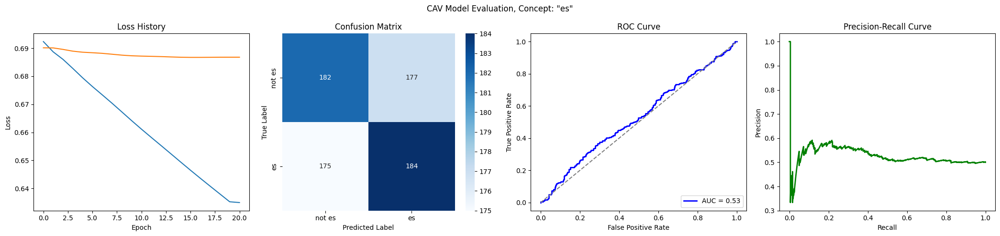

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6566
Epoch 11 Validation Loss: 0.6862
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6267
Epoch 21 Validation Loss: 0.6850
Early stopping at epoch 21
Loss history saved to trainings/language_es/loss_history.json


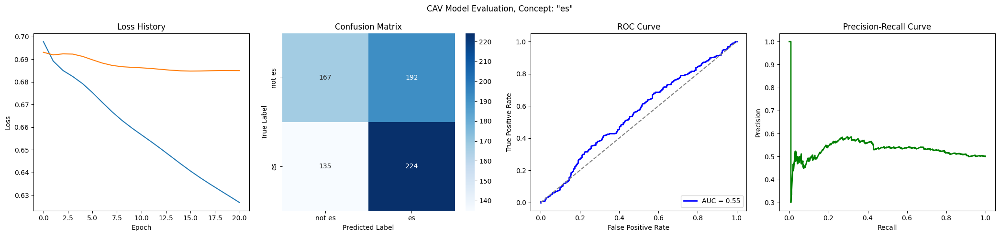

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6604
Epoch 11 Validation Loss: 0.6740
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6320
Epoch 21 Validation Loss: 0.6661
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6066
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5834
Epoch 41 Validation Loss: 0.6593
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5623
Epoch 51 Validation Loss: 0.6579
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5430
Epoch 61 Validation Loss: 0.6570
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5251
Epoch 71 Validation Loss: 0.6567
Model saved to trai

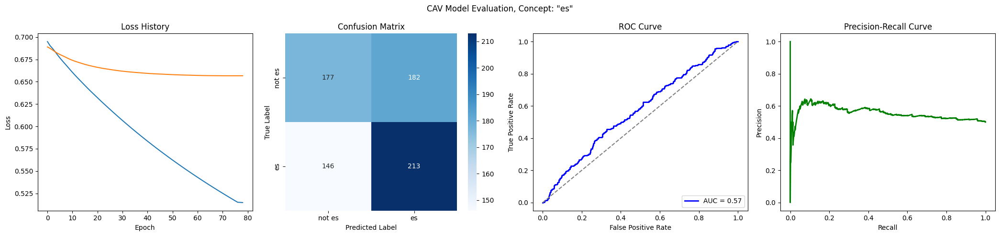

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6526
Epoch 11 Validation Loss: 0.6874
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6186
Epoch 21 Validation Loss: 0.6845
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5888
Epoch 31 Validation Loss: 0.6837
Model saved to trainings/language_es/state_dict.pth
Early stopping at epoch 40
Loss history saved to trainings/language_es/loss_history.json


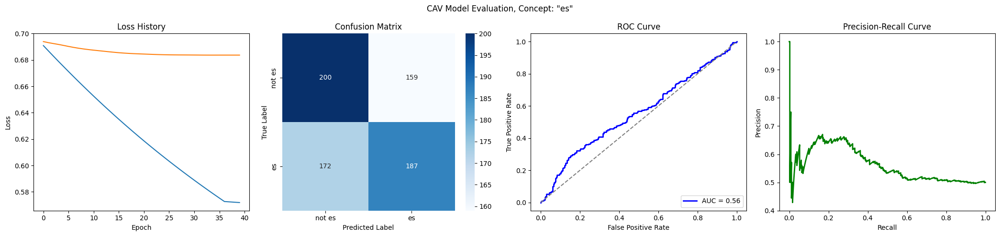

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6532
Epoch 11 Validation Loss: 0.6813
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6191
Epoch 21 Validation Loss: 0.6772
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5900
Epoch 31 Validation Loss: 0.6747
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5646
Epoch 41 Validation Loss: 0.6727
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5420
Epoch 51 Validation Loss: 0.6711
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5217
Epoch 61 Validation Loss: 0.6701
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5031
Epoch 71 Validation Loss: 0.6695
Model saved to tra

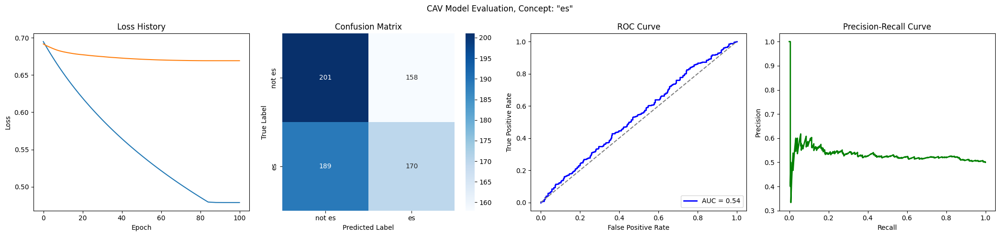

CPU times: user 10min 54s, sys: 7min 56s, total: 18min 51s
Wall time: 1h 49min 46s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

75

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


675 75
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_es/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6370
Epoch 11 Validation Loss: 0.6822
Model saved to trainings/language_es/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6030
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_es/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5778
Epoch 31 Validation Loss: 0.6574
Model saved to trainings/language_es/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5578
Epoch 41 Validation Loss: 0.6483
Model saved to trainings/language_es/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5412
Epoch 51 Validation Loss: 0.6408
Model saved to trainings/language_es/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5271
Epoch 61 Validation Loss: 0.6344
Model saved to trainings/language_es/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5147
Epoch 71 Validation Loss: 0.6289
Model saved to trainings/language_es/sta

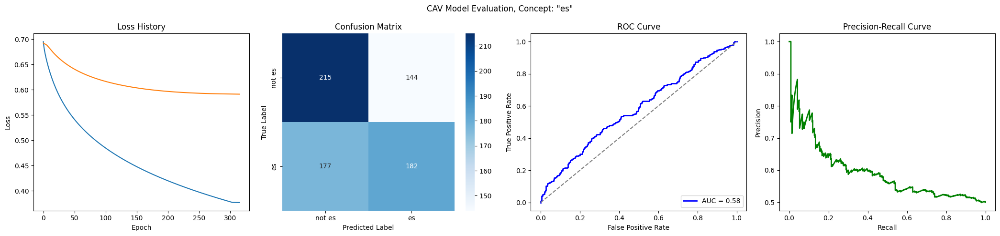

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
